# Benchmark 

In [2]:
%load_ext autoreload
%autoreload 2


In [1]:
import os
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
from scipy import sparse

# from matplotlib import font_manager, rcParams
# custom_rc = {
#     'font.family': 'Arial',  # Set the desired font for this plot
# }

# mpl.rcParams['svg.fonttype'] = 'none'
# mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "dkd_Wilson"
file_name = "dkd_Wilson"
file_suffix = time.strftime('%b%d-%H%M')

# save_dir = Path(f"../save/{proj_name}-{file_suffix}")
# save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)

seed = 0
ccd.ul.set_seed(seed)

In [4]:
# load the data
adata = sc.read_h5ad(data_dir / f"{file_name}.h5ad")

In [9]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'default_embedding', 'schema_reference', 'schema_version', 'title'


In [10]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', n_top_genes=5000, subset=False)
sc.tl.pca(adata, n_comps=300, svd_solver='arpack', use_highly_variable=True)
adata = adata[:, adata.var.highly_variable].copy()

In [12]:
# Add raw counts to adata.layers["counts"] after HVG filtering
if adata.raw is not None:
    adata.layers["counts"] = adata.raw[:, adata.var_names].X.astype(np.int32)
    print("✅ counts layer set from adata.raw (shape matched to HVGs)")
else:
    raise ValueError("❌ adata.raw is None — cannot set counts layer.")


✅ counts layer set from adata.raw (shape matched to HVGs)


In [14]:
import numpy as np

zero_expression = np.array(adata.X.sum(axis=1)).flatten() == 0
n_zero_cells = np.sum(zero_expression)

print(f"❗ {n_zero_cells} cells have 0 expression in `adata.X`")


❗ 0 cells have 0 expression in `adata.X`


In [15]:
# import pandas as pd

batch_key = 'donor_id'  # or your actual batch column in adata.obs
for batch in adata.obs[batch_key].unique():
    sub = adata[adata.obs[batch_key] == batch]
    X = sub.X.toarray() if sparse.issparse(sub.X) else sub.X
    zero_var = np.sum(np.var(X, axis=0) == 0)
    print(f"{batch}: {zero_var} zero-variance genes")


control_1: 401 zero-variance genes
control_2: 711 zero-variance genes
control_3: 285 zero-variance genes
healthy_4: 750 zero-variance genes
healthy_5: 717 zero-variance genes
diabetic_1: 464 zero-variance genes
diabetic_2: 480 zero-variance genes
diabetic_3: 537 zero-variance genes
diabetic_4: 853 zero-variance genes
diabetic_5: 931 zero-variance genes
healthy_6: 141 zero-variance genes


In [5]:
min_val = adata.X.min()
print(f"🔍 Minimum value in adata.X: {min_val}")

max_val = adata.X.max()
print(f"🔍 Maximum value in adata.X: {max_val}")

if min_val < 0:
    print("⚠️ adata.X is scaled — contains negative values.")
else:
    print("✅ adata.X is non-negative — likely log1p transformed, not scaled.")


🔍 Minimum value in adata.X: 0.0
🔍 Maximum value in adata.X: 7.346010208129883
✅ adata.X is non-negative — likely log1p transformed, not scaled.


In [14]:
counts = adata.layers["counts"]
if counts is None:
    print("❌ adata.layers['counts'] does not exist.")
else:
    # Check min and integer-ness
    if sparse.issparse(counts):
        counts = counts.data  # only nonzero values
    else:
        counts = counts.flatten()

    min_val = counts.min()
    is_integer = np.allclose(counts, np.round(counts))

    print(f"🔍 counts layer — min: {min_val}, integer-like: {is_integer}")
    if min_val < 0:
        print("❌ counts layer contains negative values!")
    elif not is_integer:
        print("❌ counts layer contains non-integer values!")
    else:
        print("✅ counts layer looks valid: non-negative integers.")


🔍 counts layer — min: 1, integer-like: True
✅ counts layer looks valid: non-negative integers.


In [17]:
# save the adata object
adata.write_h5ad(data_dir / f"{file_name}_preprocessed.h5ad")
print(f"✅ Preprocessed data saved to {data_dir / f'{file_name}_preprocessed.h5ad'}")

✅ Preprocessed data saved to ../data/dkd_Wilson/dkd_Wilson_preprocessed.h5ad


In [4]:
adata = sc.read_h5ad(data_dir / f"{file_name}_preprocessed.h5ad")

# Liger debug

In [11]:
adata

AnnData object with n_obs × n_vars = 39176 × 10000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    u

In [9]:
import numpy as np
import pyliger
from scipy.sparse import csr_matrix

In [19]:
batch_key = 'donor_id'  # or your actual batch column in adata.obs
count_layer="counts",
output_key="LIGER", 

In [20]:
batch_key = batch_key[0] if isinstance(batch_key, tuple) else batch_key
count_layer = count_layer[0] if isinstance(count_layer, tuple) else count_layer
output_key = output_key[0] if isinstance(output_key, tuple) else output_key

In [21]:
k=30, 
return_corrected=False

bdata = adata.copy()
if not bdata.obs[batch_key].dtype.name == "category":
    bdata.obs[batch_key] = bdata.obs[batch_key].astype("category")
batch_cats = bdata.obs[batch_key].cat.categories

bdata.X = bdata.layers[count_layer]
if not isinstance(bdata.X, csr_matrix):
    bdata.X = csr_matrix(bdata.X)

adata_list = [bdata[bdata.obs[batch_key] == b].copy() for b in batch_cats]
for i, ad in enumerate(adata_list):
    ad.uns["sample_name"] = batch_cats[i]
    ad.uns["var_gene_idx"] = np.arange(bdata.n_vars)

In [22]:
adata_list

[AnnData object with n_obs × n_vars = 3605 × 10000
     obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
     var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
   

In [24]:
liger_data = pyliger.create_liger(adata_list, remove_missing=False, make_sparse=False)

In [29]:
bdata.var_names

Index(['ENSG00000243485', 'ENSG00000239906', 'ENSG00000235146',
       'ENSG00000230368', 'ENSG00000241180', 'ENSG00000223764',
       'ENSG00000187634', 'ENSG00000187608', 'ENSG00000242590',
       'ENSG00000237330',
       ...
       'ENSG00000198804', 'ENSG00000198712', 'ENSG00000198938',
       'ENSG00000198695', 'ENSG00000277400', 'ENSG00000274847',
       'ENSG00000273748', 'ENSG00000276345', 'ENSG00000278633',
       'ENSG00000277196'],
      dtype='object', length=10000)

In [5]:
def run_liger_debug(adata, batch_key="donor_id", count_layer="counts", output_key="LIGER", k=30, return_corrected=False):
    import numpy as np
    import pyliger
    from scipy.sparse import csr_matrix

    bdata = adata.copy()
    if not bdata.obs[batch_key].dtype.name == "category":
        bdata.obs[batch_key] = bdata.obs[batch_key].astype("category")
    batch_cats = bdata.obs[batch_key].cat.categories

    bdata.X = bdata.layers[count_layer]
    if not isinstance(bdata.X, csr_matrix):
        bdata.X = csr_matrix(bdata.X)

    adata_list = [bdata[bdata.obs[batch_key] == b].copy() for b in batch_cats]
    for i, ad in enumerate(adata_list):
        ad.uns["sample_name"] = batch_cats[i]
        ad.uns["var_gene_idx"] = np.arange(bdata.n_vars)

    liger_data = pyliger.create_liger(adata_list, remove_missing=False, make_sparse=False)
    liger_data.var_genes = bdata.var_names

    print("DEBUG: Running normalize...")
    pyliger.normalize(liger_data)
    
    sample_names = [ad.uns["sample_name"] for ad in liger_data.adata_list]

    # --- DEBUG POINT 1 ---
    for i, ad in enumerate(liger_data.adata_list):
        print(f"DEBUG: After normalize, batch {sample_names[i]}, X stats:")
        print(f"  Shape: {ad.X.shape}")
        print(f"  Min: {ad.X.min()}, Max: {ad.X.max()}")
        print(f"  Contains NaN: {np.isnan(ad.X.data).any() if hasattr(ad.X, 'data') else np.isnan(ad.X).any()}")
        print(f"  Contains Inf: {np.isinf(ad.X.data).any() if hasattr(ad.X, 'data') else np.isinf(ad.X).any()}")
        # Check for all-zero columns (genes) after normalization
        gene_sums_norm = ad.X.sum(axis=0).A.flatten() if isinstance(ad.X, csr_matrix) else ad.X.sum(axis=0)
        n_zero_genes_norm = np.sum(gene_sums_norm == 0)
        print(f"  Number of all-zero genes after normalize: {n_zero_genes_norm}")


    print("DEBUG: Running scale_not_center...")
    pyliger.scale_not_center(liger_data)

    # --- DEBUG POINT 2 ---
    
    for i, ad in enumerate(liger_data.adata_list):
        print(f"DEBUG: After scale_not_center, batch {sample_names[i]}, X stats:")
        print(f"  Shape: {ad.X.shape}")
        print(f"  Min: {ad.X.min()}, Max: {ad.X.max()}")
        print(f"  Contains NaN: {np.isnan(ad.X.data).any() if hasattr(ad.X, 'data') else np.isnan(ad.X).any()}")
        print(f"  Contains Inf: {np.isinf(ad.X.data).any() if hasattr(ad.X, 'data') else np.isinf(ad.X).any()}")
        # Check for all-zero columns (genes) after scaling
        gene_sums_scaled = ad.X.sum(axis=0).A.flatten() if isinstance(ad.X, csr_matrix) else ad.X.sum(axis=0)
        n_zero_genes_scaled = np.sum(gene_sums_scaled == 0)
        print(f"  Number of all-zero genes after scale: {n_zero_genes_scaled}")
        # Check if any gene variance is zero (this is what pyliger.preprocessing._scale.py checks)
        # This requires access to the internal `cell_data` objects in liger_data, which is less direct.
        # A more direct check would be to see if there are columns with constant values (and thus zero variance).
        # For sparse matrices, this is trickier than summing zeros.

    print("DEBUG: Running optimize_ALS...")
    pyliger.optimize_ALS(liger_data, k=k)
    print("DEBUG: optimize_ALS finished.") # This won't print if it hangs here.

    pyliger.quantile_norm(liger_data)

    # Initialize the obsm field for the integrated data
    adata.obsm[output_key] = np.zeros((adata.shape[0], liger_data.adata_list[0].obsm["H_norm"].shape[1]))

    # Populate the integrated embeddings back into the main AnnData object
    for i, b in enumerate(batch_cats):
        adata.obsm[output_key][adata.obs[batch_key] == b] = liger_data.adata_list[i].obsm["H_norm"]

    if return_corrected:
        corrected_expression = np.zeros(adata.shape)
        for i, b in enumerate(batch_cats):
            H = liger_data.adata_list[i].obsm["H_norm"]
            W = liger_data.W
            corrected_expression[adata.obs[batch_key] == b] = H @ W.T

        adata.layers[output_key + "_corrected"] = corrected_expression

In [6]:
run_liger_debug(adata, k=20)

DEBUG: Running normalize...
DEBUG: After normalize, batch control_1, X stats:
  Shape: (3605, 10000)
  Min: 0, Max: 1219
  Contains NaN: False
  Contains Inf: False
  Number of all-zero genes after normalize: 633
DEBUG: After normalize, batch control_2, X stats:
  Shape: (2552, 10000)
  Min: 0, Max: 538
  Contains NaN: False
  Contains Inf: False
  Number of all-zero genes after normalize: 1504
DEBUG: After normalize, batch control_3, X stats:
  Shape: (5278, 10000)
  Min: 0, Max: 950
  Contains NaN: False
  Contains Inf: False
  Number of all-zero genes after normalize: 615
DEBUG: After normalize, batch diabetic_1, X stats:
  Shape: (2996, 10000)
  Min: 0, Max: 1100
  Contains NaN: False
  Contains Inf: False
  Number of all-zero genes after normalize: 840
DEBUG: After normalize, batch diabetic_2, X stats:
  Shape: (2468, 10000)
  Min: 0, Max: 1513
  Contains NaN: False
  Contains Inf: False
  Number of all-zero genes after normalize: 1084
DEBUG: After normalize, batch diabetic_3, X s

  0%|          | 0/30 [00:00<?, ?it/s]

: 

# Liger debug end here

In [23]:
import subprocess, json
methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]

# concord_args = {
#     "encoder_dims": [512, 256],
#     "beta": 0.1,
#     "n_epochs": 10
# }

output_dir = '../jobs'
device = 'auto'
conda_env = 'concord_env'
batch_key = 'donor_id'
state_key = 'cell_type'
latent_dim = '50'  # Adjust as needed, but should match the encoder_dims in concord_args

mode = 'local'

subprocess.run([
    "python", "./generate_py_sh_jobs.py",
    "--proj_name", proj_name,
    "--adata_filename", f"{file_name}_preprocessed.h5ad",
    "--methods", *methods,
    "--batch_key", batch_key,
    "--state_key", state_key,
    "--latent_dim", latent_dim,
    "--output_dir", output_dir,
    "--device", device,
    "--conda_env", conda_env,
    "--runtime", "02:00:00",
    "--mode", mode,
    # "--concord_kwargs", json.dumps(concord_args)
], check=True)

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scvi.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scvi.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_harmony.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_harmony.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scanorama.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_scanorama.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_liger.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_liger.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_unintegrated.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_unintegrated.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_hcl.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_hcl.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_knn.py
✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_Wilson_concord_knn.sh

✅ Generated: benchmark_dkd_Wilson/benchmark_dkd_W

CompletedProcess(args=['python', './generate_py_sh_jobs.py', '--proj_name', 'dkd_Wilson', '--adata_filename', 'dkd_Wilson_preprocessed.h5ad', '--methods', 'scvi', 'harmony', 'scanorama', 'liger', 'unintegrated', 'concord_hcl', 'concord_knn', 'contrastive', '--batch_key', 'donor_id', '--state_key', 'cell_type', '--latent_dim', '50', '--output_dir', '../jobs', '--device', 'auto', '--conda_env', 'concord_env', '--runtime', '02:00:00', '--mode', 'local'], returncode=0)

In [ ]:
proj_folder = Path(output_dir) / f"benchmark_{proj_name}"
proj_folder.mkdir(parents=True, exist_ok=True)  # defensive

submit_all = proj_folder / f"submit_all_{proj_name}.sh"

with submit_all.open("w") as f:
    f.write("#!/bin/bash\n")
    f.write("# Auto-generated — sequentially runs every job script\n")
    f.write('cd "$(dirname "$0")"\n\n')
    f.write("timestamp=$(date +'%m%d-%H%M')\n\n")

    for sh_file in sorted(proj_folder.glob(f"benchmark_{proj_name}_*.sh")):
        base = sh_file.stem
        f.write(f"echo '🔄 Running: {sh_file.name} (log: {base}_${{timestamp}}.log)'\n")
        f.write(f"bash {sh_file.name} > {base}_${{timestamp}}.log 2>&1\n")
        f.write("echo '✅ Done.'\n\n")

submit_all.chmod(0o755)
print(f"📌  Next step: Run “{submit_all}” to execute all jobs sequentially.")

📌  Run “../jobs/benchmark_dkd_Wilson/submit_all_dkd_Wilson.sh” to execute all jobs sequentially.


In [7]:
# map the obsm back to the adata 
# for each method, uses the most recent run (based on timestamp)
# methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]
methods = ["scvi", "harmony", "scanorama", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]

from benchmark_utils import add_embeddings

adata = add_embeddings(adata, proj_name=proj_name, methods=methods)



✅ obsm['scvi'] loaded
✅ obsm['harmony'] loaded
✅ obsm['scanorama'] loaded
✅ obsm['unintegrated'] loaded
✅ obsm['concord_hcl'] loaded
✅ obsm['concord_knn'] loaded
✅ obsm['contrastive'] loaded


In [8]:
adata

AnnData object with n_obs × n_vars = 39176 × 10000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    u

In [10]:
save_dir = Path(f"../save/{proj_name}-{file_suffix}")
save_dir.mkdir(parents=True, exist_ok=True)

In [11]:
for method in methods:
    if f"{method}_UMAP" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 2D UMAP for {method}...")
        ccd.ul.run_umap(adata, source_key=f"{method}", result_key=f"{method}_UMAP", n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP'] computed")
    if f"{method}_UMAP_3D" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP_3D'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 3D UMAP for {method}...")
        ccd.ul.run_umap(adata,source_key=f"{method}",result_key=f"{method}_UMAP_3D",n_components=3,  min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP_3D'] computed")

ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")
print(f"✅ Embeddings saved to {save_dir / f'obsm_{file_suffix}.h5'}")
final_path = data_dir / f"{file_name}_final.h5ad"
adata.write_h5ad(final_path)
print(f"✅ Final AnnData saved to: {final_path}")

Computing 2D UMAP for scvi...
Concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP']
✅ obsm['scvi_UMAP'] computed
Computing 3D UMAP for scvi...
Concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP_3D']
✅ obsm['scvi_UMAP_3D'] computed
Computing 2D UMAP for harmony...
Concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP']
✅ obsm['harmony_UMAP'] computed
Computing 3D UMAP for harmony...
Concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP_3D']
✅ obsm['harmony_UMAP_3D'] computed
Computing 2D UMAP for scanorama...
Concord - INFO - UMAP embedding stored in adata.obsm['scanorama_UMAP']
✅ obsm['scanorama_UMAP'] computed
Computing 3D UMAP for scanorama...
Concord - INFO - UMAP embedding stored in adata.obsm['scanorama_UMAP_3D']
✅ obsm['scanorama_UMAP_3D'] computed
Computing 2D UMAP for unintegrated...
Concord - INFO - UMAP embedding stored in adata.obsm['unintegrated_UMAP']
✅ obsm['unintegrated_UMAP'] computed
Computing 3D UMAP for unintegrated.

In [12]:
adata

AnnData object with n_obs × n_vars = 39176 × 10000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    u

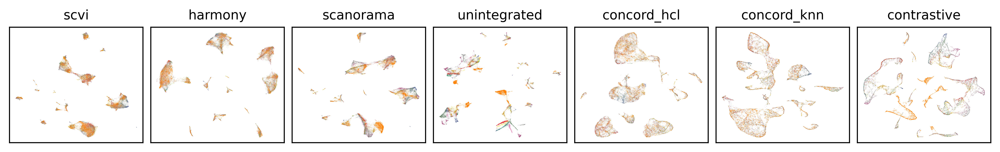

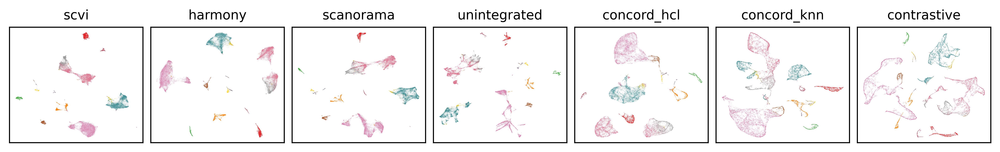

In [15]:
# plot everything
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# Set DejaVu Sans as the default font
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}

show_keys = methods
show_cols = ['donor_id', 'cell_type']
basis_types = ['UMAP']

font_size=10
point_size=.1
alpha=0.8
ncols = len(show_keys)
figsize=(ncols * 1.5,1.5)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = {'donor_id': 'Set1', 
       'cell_type': 'Set1'}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=show_cols,
        basis_types=basis_types,
        pal=pal,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        save_dir=save_dir,
        file_suffix=file_suffix,
        dpi=600,
        save_format='svg'
    )


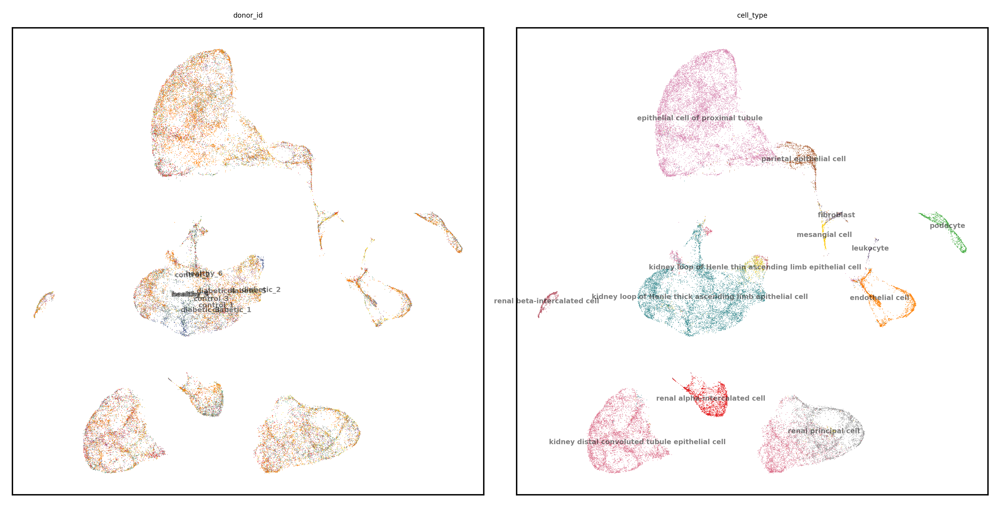

In [20]:
output_key = 'concord_hcl'
basis = output_key
show_basis = basis + '_UMAP'
show_cols = ['donor_id', 'cell_type']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(8,4), dpi=600, ncols=2, font_size=4, point_size=0.5, legend_loc='on data',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

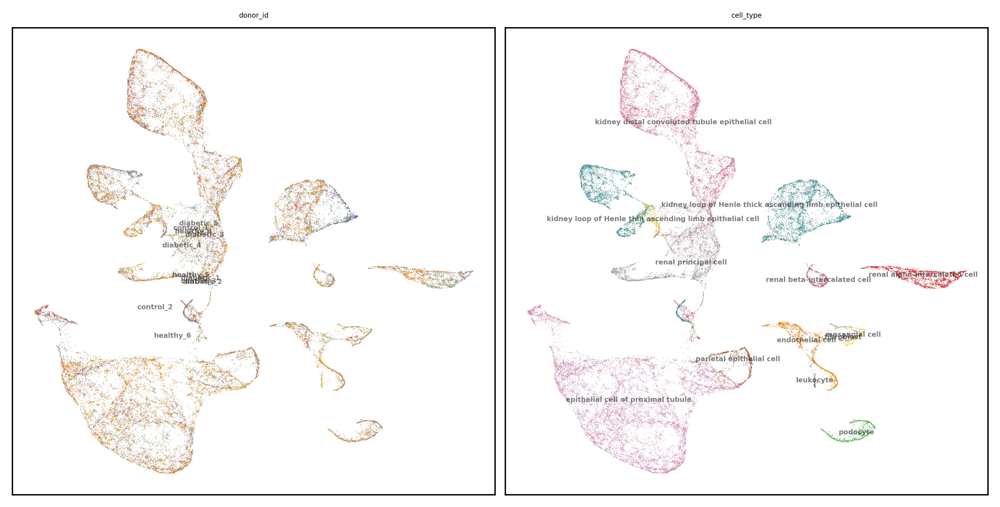

In [21]:
output_key = 'concord_knn'
basis = output_key
show_basis = basis + '_UMAP'
show_cols = ['donor_id', 'cell_type']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(8,4), dpi=600, ncols=2, font_size=4, point_size=0.5, legend_loc='on data',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

In [24]:
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='cel')
print(f"Saved viscello to {data_dir / f'cello_{proj_name}_{file_suffix}'}")

VisCello project created at ../data/dkd_Wilson/cello_dkd_Wilson_Jun30-0233
Saved viscello to ../data/dkd_Wilson/cello_dkd_Wilson_Jun30-0233


# Benchmarking

✅ Benchmark summary saved to: ../save/dkd_Wilson-Jun30-0233/benchmark_summary_Jun30-0233.tsv


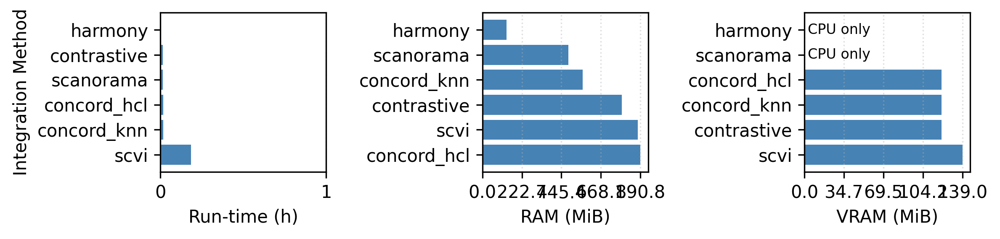

In [27]:
from benchmark_utils import collect_benchmark_logs
bench_df = collect_benchmark_logs("dkd_Wilson", methods)
# Save the benchmark results
bench_df.to_csv(save_dir / f"benchmark_summary_{file_suffix}.tsv", sep="\t", index=False)
print(f"✅ Benchmark summary saved to: {save_dir / f'benchmark_summary_{file_suffix}.tsv'}")
# Plot benchmark results
from benchmark_utils import plot_benchmark_performance
import matplotlib.pyplot as plt
custom_rc = {
    'font.family': 'DejaVu Sans',  # Set the desired font for this plot
}
with plt.rc_context(rc=custom_rc):
    plot_benchmark_performance(bench_df, figsize=(8,2), dpi=300, save_path = save_dir / f"benchmark_plot_{file_suffix}.pdf")


In [36]:
import scib_metrics
print("scib_metrics version:", scib_metrics.__version__)

scib_metrics version: 0.5.3


Detected task: classification


Detected task: classification
[KNN] detected task: classification
[KNN] detected task: classification


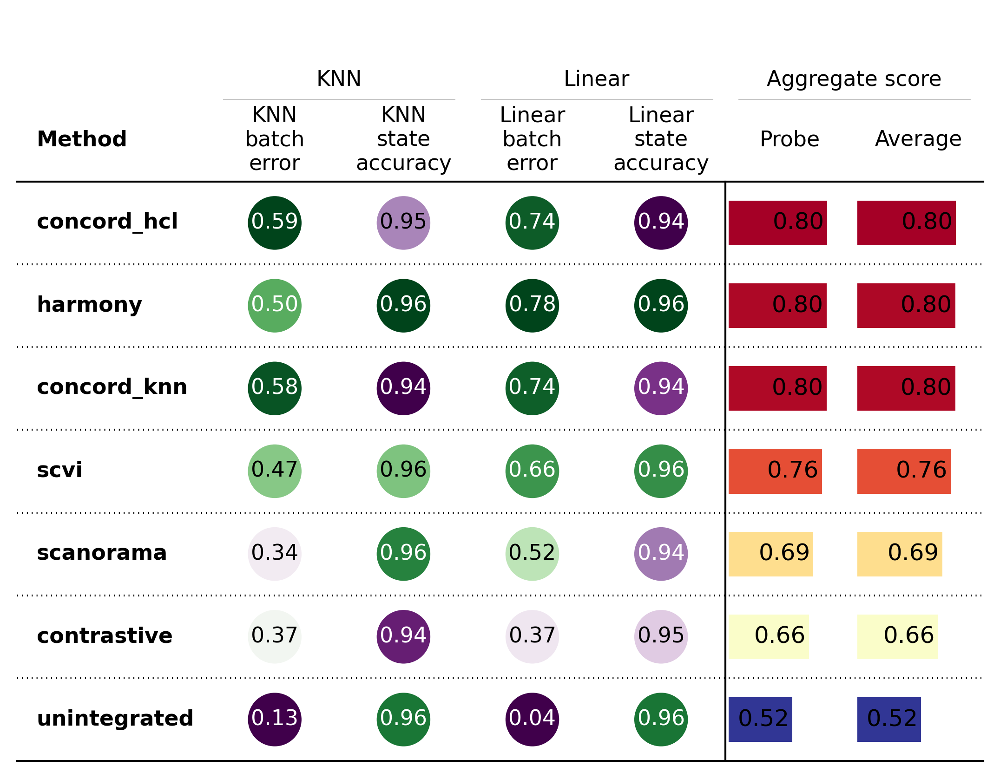

✅ Benchmark results saved to: ../save/dkd_Wilson-Jun30-0532/benchmark_cell_type_Jun30-0532.pkl


In [12]:
state_key = 'cell_type'
batch_key = 'donor_id'
save_dir = Path(f"../save/{proj_name}-{file_suffix}")
out = ccd.bm.run_benchmark_pipeline(
    adata,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_celltype",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_celltype = out["combined"]

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_{state_key}_{file_suffix}.pkl'}")

In [ ]:
methods = ["scvi", "harmony", "scanorama", "unintegrated", "concord_hcl", "concord_knn", "contrastive"]
state_key = "cell_type"
batch_key = "donor_id"

In [4]:
adata = sc.read_h5ad(data_dir / f"{file_name}_final.h5ad")

In [5]:
from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection

In [6]:
bm = Benchmarker(
    adata,
    batch_key="donor_id",
    label_key="cell_type",
    bio_conservation_metrics=BioConservation(),
    batch_correction_metrics=BatchCorrection(),
    embedding_obsm_keys=["unintegrated", "scanorama", "harmony", "scvi", "concord_hcl", "concord_knn", "contrastive"],
    n_jobs=4,
)
bm.benchmark()

Embeddings:   0%|          | 0/7 [00:00<?, ?it/s]E0630 18:55:49.228015    9689 cuda_dnn.cc:523] Loaded runtime CuDNN library: 9.5.1 but source was compiled with: 9.8.0.  CuDNN library needs to have matching major version and equal or higher minor version. If using a binary install, upgrade your CuDNN library.  If building from sources, make sure the library loaded at runtime is compatible with the version specified during compile configuration.
E0630 18:55:49.231520    9689 cuda_dnn.cc:523] Loaded runtime CuDNN library: 9.5.1 but source was compiled with: 9.8.0.  CuDNN library needs to have matching major version and equal or higher minor version. If using a binary install, upgrade your CuDNN library.  If building from sources, make sure the library loaded at runtime is compatible with the version specified during compile configuration.
E0630 18:55:49.375758    9689 cuda_dnn.cc:523] Loaded runtime CuDNN library: 9.5.1 but source was compiled with: 9.8.0.  CuDNN library needs to have ma

XlaRuntimeError: FAILED_PRECONDITION: DNN library initialization failed. Look at the errors above for more details.

In [1]:
import jax
import sys

print(f"JAX version: {jax.__version__}")
print(f"JAXlib version: {jax.lib.__version__}")

try:
    print(f"JAXlib CUDA runtime version: {jax.lib.xla_client.cuda_runtime_version}")
    print(f"JAXlib cuDNN version: {jax.lib.xla_client.cudnn_version}")
except AttributeError:
    print("Could not retrieve JAXlib CUDA/cuDNN versions. This might mean you're on a CPU build or an older jaxlib.")

TypeError: argument should be a str or an os.PathLike object where __fspath__ returns a str, not 'NoneType'